In [4]:
# Mounting Google Drive to Colab Notebook
# This code block is essential for accessing files stored in your Google Drive while working in a Colab notebook.
# It mounts your Google Drive to the notebook, allowing you to read and write files just like on a local filesystem.
from google.colab import drive
drive.mount('/content/drive')

In [5]:
# Unzipping Dataset
# This block unzips the dataset stored in a zip file on Google Drive to a local directory in the Colab environment.
# It's necessary for making the dataset available for processing and training the models.
!unzip '/content/drive/My Drive/chest_xray.zip' -d '/content/chest_xray'

In [6]:
# Importing Libraries and Modules
# This section imports all necessary libraries and modules for the project.
# It includes core libraries like os, cv2 (OpenCV), numpy, matplotlib, and seaborn for data handling and visualization,
# TensorFlow and Keras for building and training neural network models, and sklearn for model evaluation metrics.

In [8]:
# Core libraries
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
import seaborn as sns

# TensorFlow and Keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# Sklearn utilities
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix


In [ ]:
# Image Preprocessing Function
# This function reads an image from a given path, converts it to RGB, resizes it to a specified size, and normalizes its pixel values.
# It's a crucial step to prepare the images for input into the neural network models.

In [9]:
# Function to preprocess images
def process_images(image_path, img_size=(224, 224)):
    """
    Reads an image from a path, converts it to RGB, resizes, and normalizes it.
    """
    image = cv2.imread(image_path)
    if image is None:
        print(f"Warning: Could not read image {image_path}. Skipping.")
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, img_size) / 255.0
    return image


# Data Loading Function
# This function loads images and their labels from a given directory into numpy arrays, with a specified maximum number of images per class.
# It's used to read the dataset in a structured format necessary for training and testing the models.
def load_data(directory, max_images_per_class=1000):
    """
    Loads images and labels from a given directory, limiting to a maximum number per class.
    Assumes subdirectories represent class names.
    """
    images = []
    labels = []
    print(f"Loading data from: {directory}")
    for label in ['NORMAL', 'PNEUMONIA']:
        class_dir = os.path.join(directory, label)
        print(f"Accessing directory: {class_dir}")
        image_paths = os.listdir(class_dir)[:max_images_per_class]  # Get only the required number of images
        for image_path in tqdm(image_paths, desc=f"Loading {label} images"):
            full_path = os.path.join(class_dir, image_path)
            img = process_images(full_path)
            if img is not None:
                images.append(img)
                labels.append(1 if label == 'PNEUMONIA' else 0)
    return np.array(images), np.array(labels)

In [ ]:
# Setting Directory Paths and Loading Data
# These lines set the directory paths for training and test data, and call the `load_data` function to load these datasets.
# It's important for organizing data and making it accessible for model training and evaluation.

In [20]:
# Set directory paths
# data_dir = './chest_xray'  # Adjusted to point to the local directory
data_dir = '/content/chest_xray/chest_xray'  # Adjusted to point to the correct directory in Colab
train_dir = os.path.join(data_dir, 'train')
test_dir = os.path.join(data_dir, 'test')

# Print to verify the paths
print(f"Train directory: {train_dir}")
print(f"Test directory: {test_dir}")

# Load training and test data
X_train, y_train = load_data(train_dir)
X_test, y_test = load_data(test_dir)

# Split training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


Train directory: ./chest_xray\train
Test directory: ./chest_xray\test
Loading data from: ./chest_xray\train
Accessing directory: ./chest_xray\train\NORMAL


Loading NORMAL images:   0%|          | 0/1000 [00:00<?, ?it/s]

Loading NORMAL images: 100%|██████████| 1000/1000 [00:22<00:00, 43.54it/s]


Accessing directory: ./chest_xray\train\PNEUMONIA


Loading PNEUMONIA images: 100%|██████████| 1000/1000 [00:09<00:00, 104.01it/s]


Loading data from: ./chest_xray\test
Accessing directory: ./chest_xray\test\NORMAL


Loading NORMAL images: 100%|██████████| 234/234 [00:04<00:00, 50.87it/s]


Accessing directory: ./chest_xray\test\PNEUMONIA


Loading PNEUMONIA images: 100%|██████████| 390/390 [00:03<00:00, 127.99it/s]


In [ ]:
# Function to Visualize Sample Images
# This function plots a grid of images with their corresponding labels. It's useful for a visual inspection of the data.

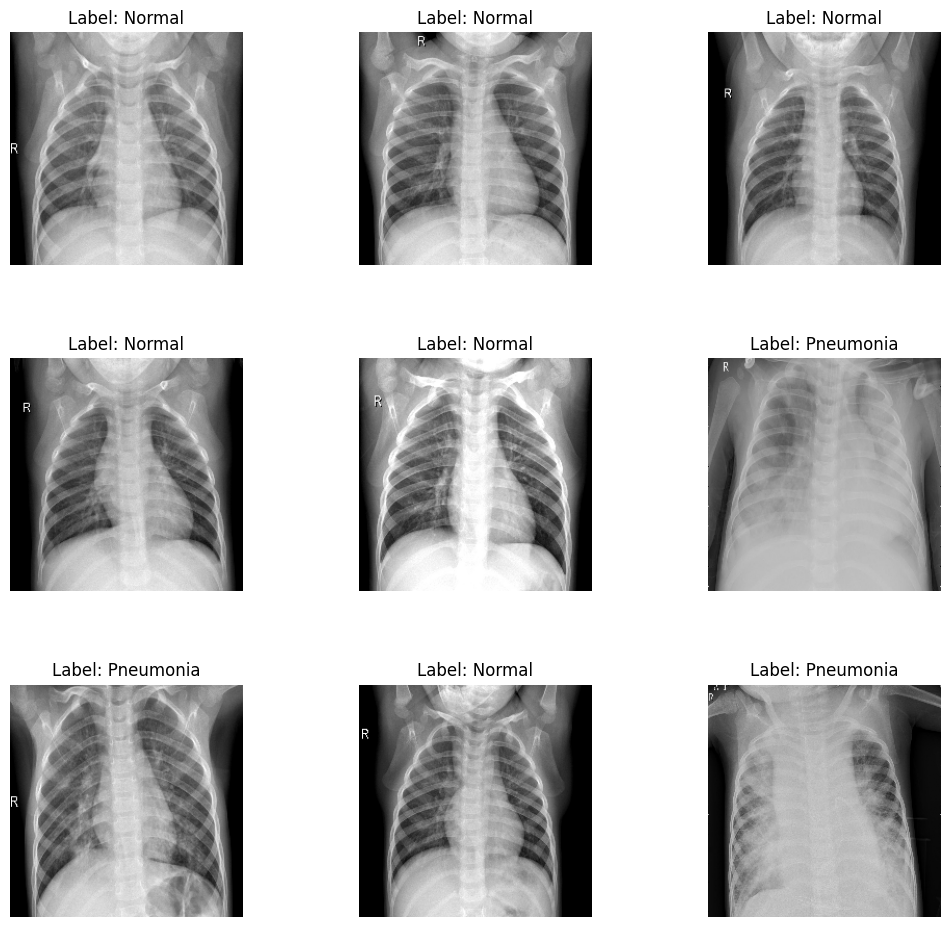

In [12]:
# Function to visualize sample images
def plot_images(images, labels, rows=3, cols=3):
    """
    Plots a grid of images with their corresponding labels.
    """
    fig, axes = plt.subplots(rows, cols, figsize=(12,12))
    axes = axes.ravel()
    for i in np.arange(0, rows * cols):
        axes[i].imshow(images[i], cmap='gray')
        axes[i].set_title('Label: %s' % ('Pneumonia' if labels[i] else 'Normal'))
        axes[i].axis('off')
    plt.subplots_adjust(wspace=0.5)

# Plotting Sample Images
# This line calls the `plot_images` function to display a grid of sample images from the training set.
plot_images(X_train, y_train)

In [13]:
# Functions to Create Neural Network Models
# These functions define the architecture for different CNN models: a custom model, VGG16, and AlexNet.
# They are essential for creating models that can be trained on the dataset.

In [15]:
# Function to create a CNN model
def create_model(layers, neurons, activation='relu'):
    """
    Creates a CNN model with a specified number of layers, neurons, and an activation function.
    """
    model = Sequential()
    model.add(Conv2D(neurons, (3, 3), activation=activation, input_shape=(224, 224, 3)))
    model.add(MaxPooling2D(2, 2))

    for i in range(layers-1):
        model.add(Conv2D(neurons, (3, 3), activation=activation))
        model.add(MaxPooling2D(2,2))

    model.add(Flatten())
    model.add(Dense(128, activation=activation))
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model



# Training Multiple Models
# This block configures and trains different CNN models based on various configurations,
# and stores their training histories for comparison and analysis.
models_histories = {}
configurations = [
    {'name': '2Layer_32Neurons_ReLU', 'layers': 2, 'neurons': 32, 'activation': 'relu'},
    {'name': '4Layer_64Neurons_ReLU', 'layers': 3, 'neurons': 64, 'activation': 'relu'},  # Deeper network with more neurons
    {'name': '2Layer_128Neurons_ReLU', 'layers': 2, 'neurons': 128, 'activation': 'relu'}, # Wider network with more neurons in each layer
    {'name': '3Layer_32Neurons_LeakyReLU', 'layers': 3, 'neurons': 32, 'activation': 'leaky_relu'}, # Using Leaky ReLU activation
    {'name': '2Layer_32Neurons_ELU', 'layers': 2, 'neurons': 32, 'activation': 'elu'}, # Using ELU activation
]

for config in configurations:
    model = create_model(config['layers'], config['neurons'], config['activation'])

    history = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val), verbose=1)
    models_histories[config['name']] = history

Epoch 1/10
50/50 [==============================] - 30s 585ms/step - loss: 0.9215 - accuracy: 0.7419 - val_loss: 0.2634 - val_accuracy: 0.9100
Epoch 2/10
50/50 [==============================] - 29s 581ms/step - loss: 0.2003 - accuracy: 0.9244 - val_loss: 0.1205 - val_accuracy: 0.9550
Epoch 3/10
50/50 [==============================] - 29s 576ms/step - loss: 0.1303 - accuracy: 0.9606 - val_loss: 0.1034 - val_accuracy: 0.9650
Epoch 4/10
50/50 [==============================] - 29s 572ms/step - loss: 0.0918 - accuracy: 0.9625 - val_loss: 0.0998 - val_accuracy: 0.9600
Epoch 5/10
50/50 [==============================] - 29s 573ms/step - loss: 0.0745 - accuracy: 0.9731 - val_loss: 0.0826 - val_accuracy: 0.9625
Epoch 6/10
50/50 [==============================] - 29s 575ms/step - loss: 0.0547 - accuracy: 0.9825 - val_loss: 0.1037 - val_accuracy: 0.9525
Epoch 7/10
50/50 [==============================] - 28s 565ms/step - loss: 0.0460 - accuracy: 0.9806 - val_loss: 0.1159 - val_accuracy: 0.9500

In [16]:
# Function to Plot Model Performance
# This function plots the training and validation accuracy and loss for each model and identifies the best-performing model.
# It's important for evaluating and comparing the performance of different models.

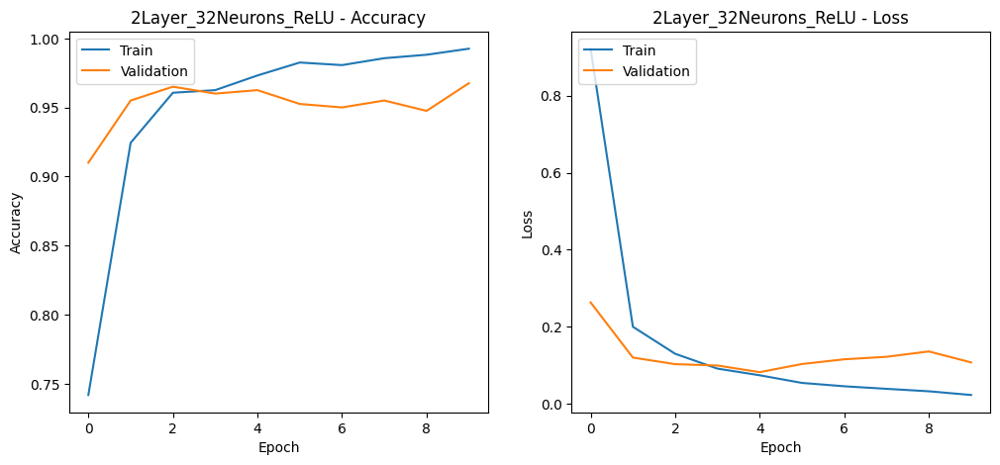

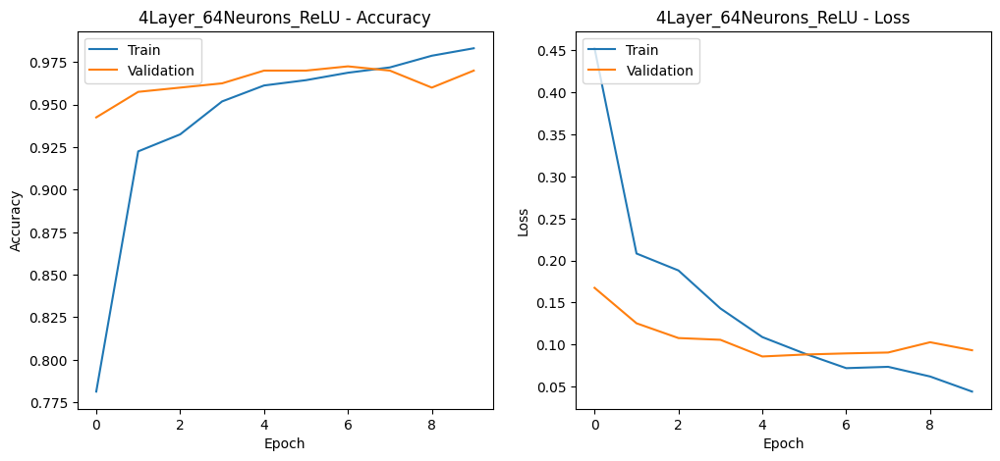

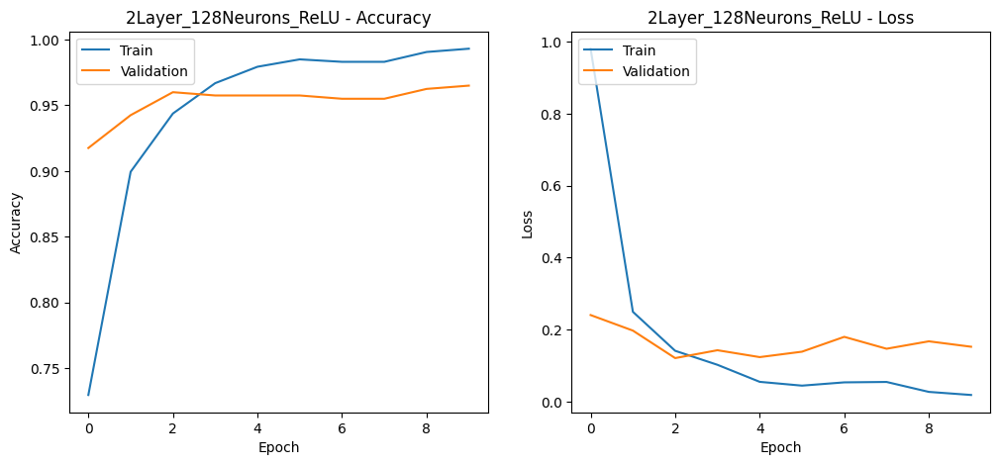

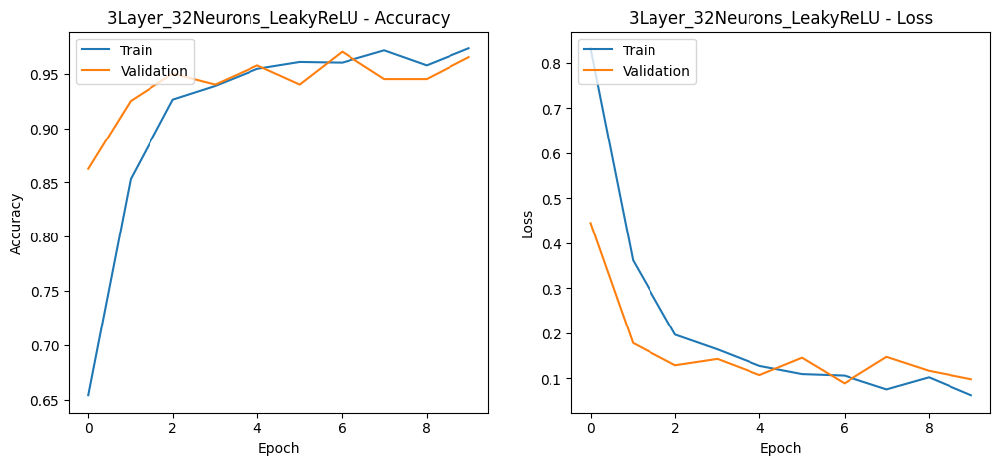

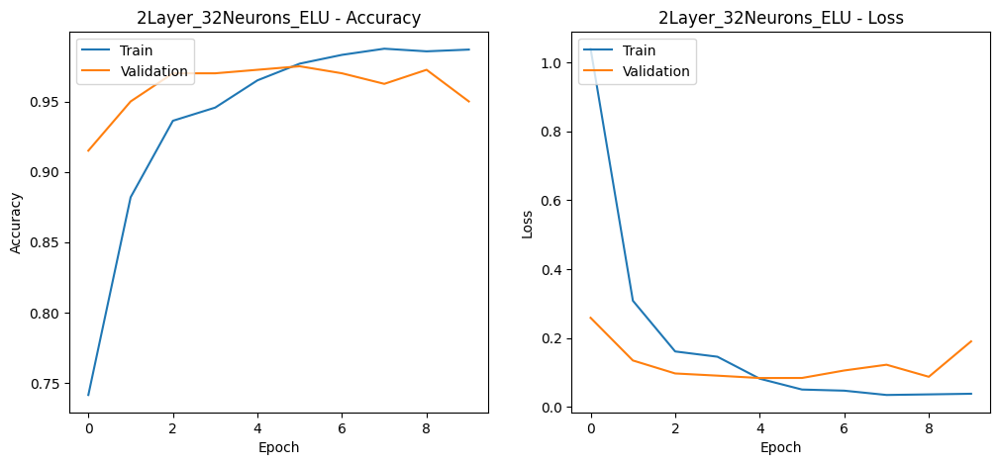

The best performing model is 2Layer_32Neurons_ELU with a validation accuracy of 0.98


In [17]:
# Function to plot accuracy and loss graphs for each model configuration
def plot_model_performance(models_histories):
    """
    Plots training and validation accuracy and loss for each model configuration.
    Also prints out which model has the best performance based on validation accuracy.
    """
    best_model = None
    best_accuracy = 0

    for config, history in models_histories.items():
        # Plotting
        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'])
        plt.plot(history.history['val_accuracy'])
        plt.title(f'{config} - Accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')

        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title(f'{config} - Loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()

        # Checking for the best model
        max_val_accuracy = max(history.history['val_accuracy'])
        if max_val_accuracy > best_accuracy:
            best_accuracy = max_val_accuracy
            best_model = config

    # Printing the best model
    print(f"The best performing model is {best_model} with a validation accuracy of {best_accuracy:.2f}")
    return best_model

# Plot the performance of each model and find the best one
best_model_name = plot_model_performance(models_histories)

In [18]:
# Function to Visualize Model Predictions
# This function visualizes the model predictions on validation images, displaying actual and predicted labels.
# It helps in understanding how well the model is performing on unseen data.

1/1 [==============================] - 0s 24ms/step


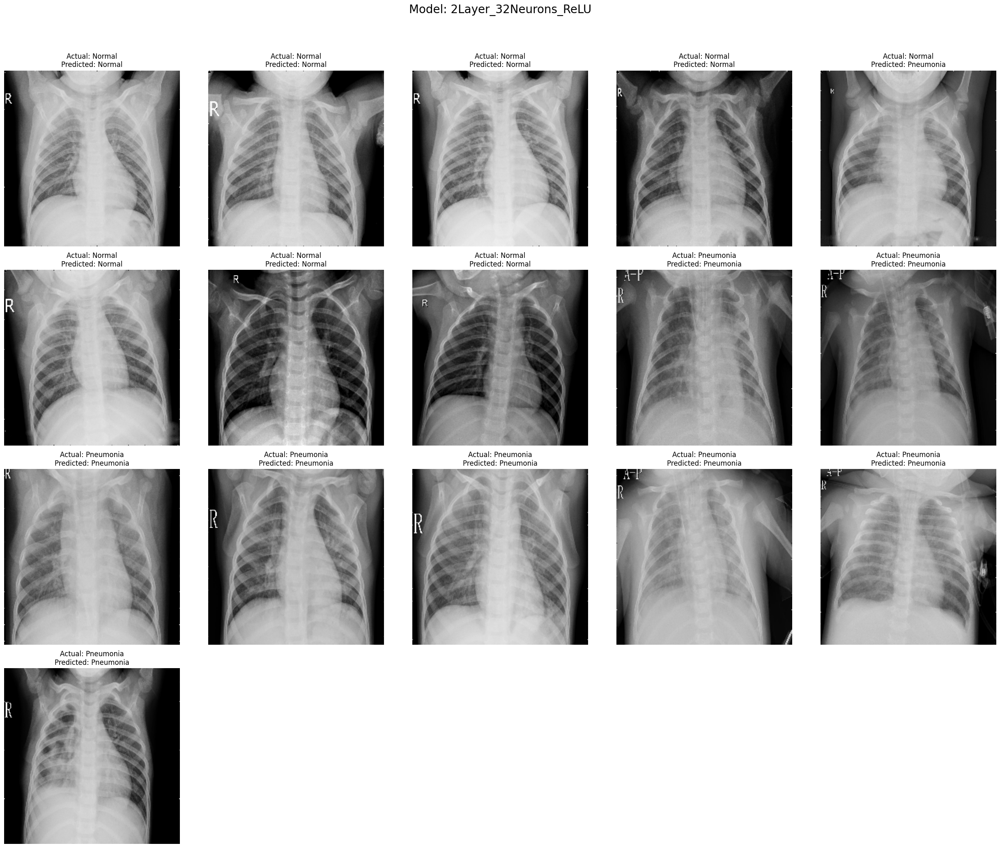

1/1 [==============================] - 0s 27ms/step


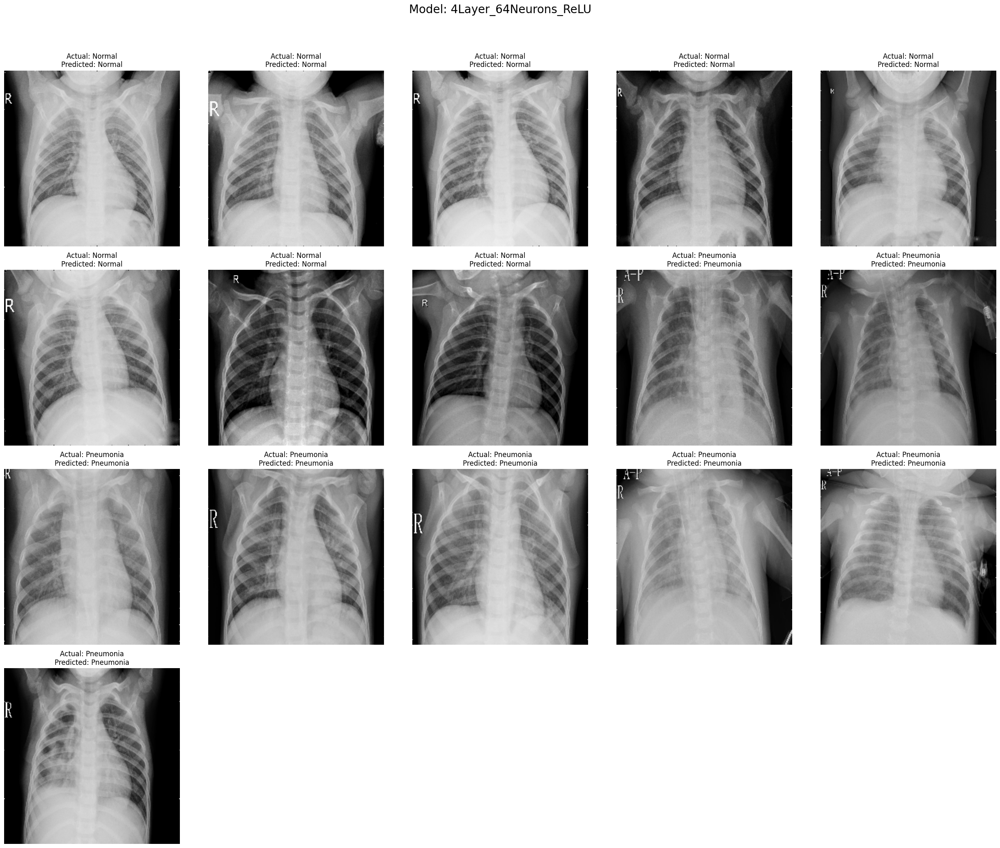

1/1 [==============================] - 0s 51ms/step


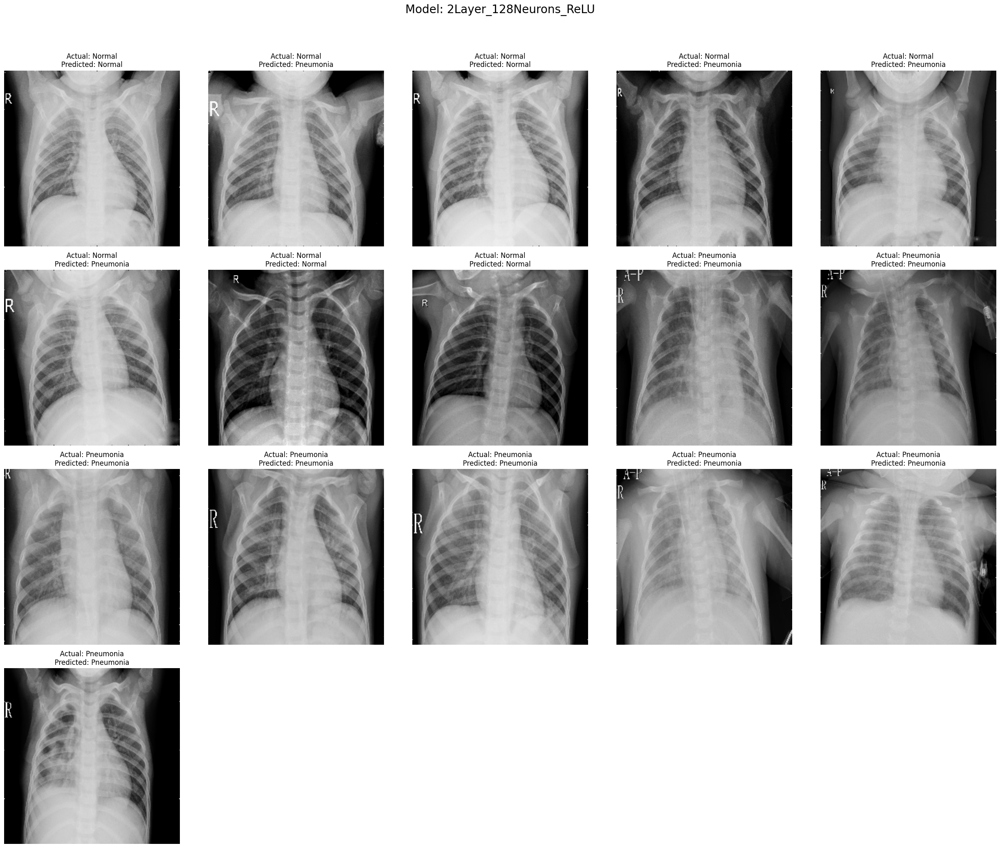

1/1 [==============================] - 0s 30ms/step


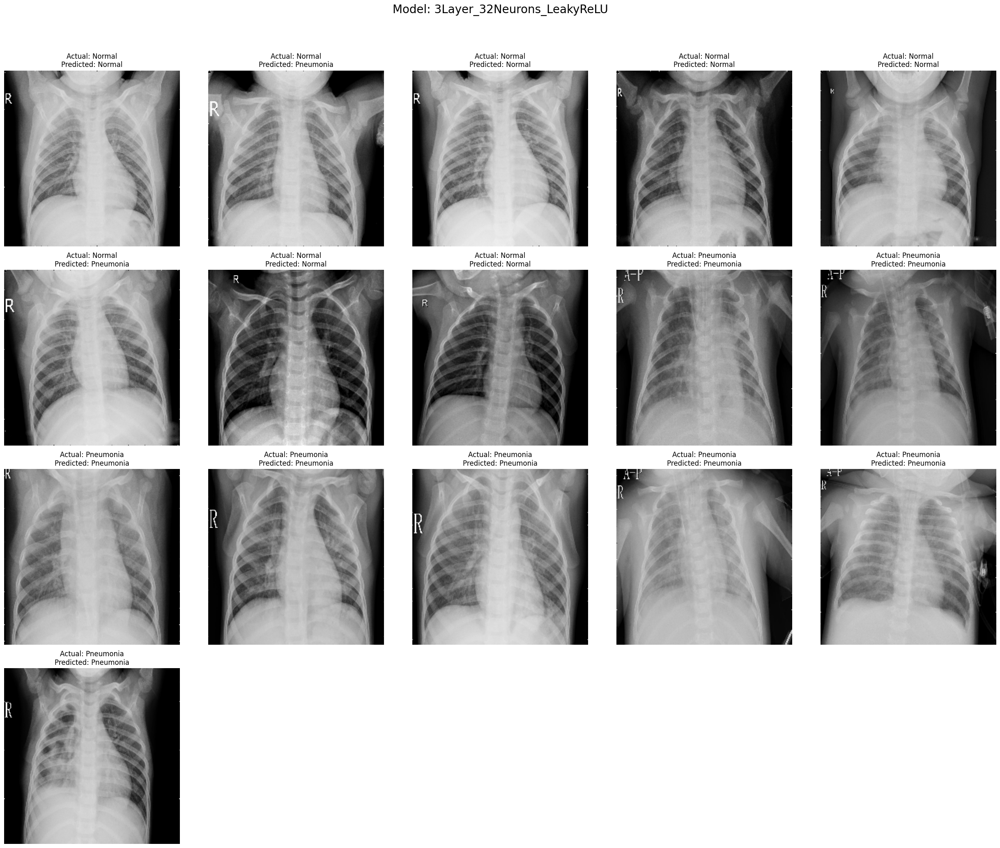

1/1 [==============================] - 0s 25ms/step


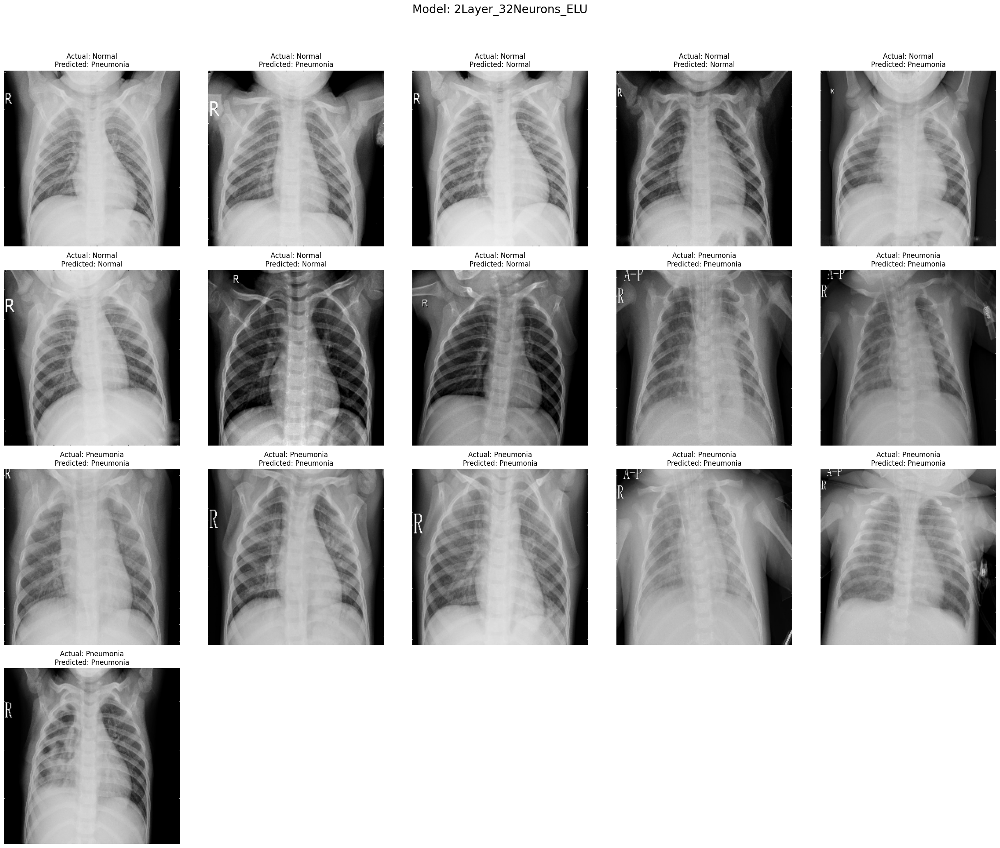

In [21]:
def visualize_predictions(model, model_name, val_normal_dir, val_pneumonia_dir, num_images=10):
    """
    Visualizes model predictions on validation images from NORMAL and PNEUMONIA classes.
    Displays the model name once prominently above the images.
    """
    images, labels, predictions = [], [], []

    # Load and preprocess images
    for image_path in os.listdir(val_normal_dir)[:num_images] + os.listdir(val_pneumonia_dir)[:num_images]:
        full_path = os.path.join(val_normal_dir if 'NORMAL' in image_path else val_pneumonia_dir, image_path)
        img = process_images(full_path)
        if img is not None:
            images.append(img)
            labels.append(0 if 'NORMAL' in image_path else 1)
            predictions.append(model.predict(np.expand_dims(img, axis=0))[0, 0])

    # Define the number of columns for subplot
    num_columns = 5
    num_rows = (2 * num_images + num_columns - 1) // num_columns  # Ensure enough rows for all images

    # Visualize predictions
    plt.figure(figsize=(5 * num_columns, 5 * num_rows))  # Adjust the figure size as needed
    plt.suptitle(f"Model: {model_name}", fontsize=20, y=1.03)  # Display the model name once
    for i, image in enumerate(images):
        plt.subplot(num_rows, num_columns, i + 1)
        plt.imshow(image, cmap='gray')
        actual_label = 'Normal' if labels[i] == 0 else 'Pneumonia'
        predicted_label = 'Normal' if predictions[i] < 0.5 else 'Pneumonia'
        plt.title(f"Actual: {actual_label}\nPredicted: {predicted_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Then, call this function for each model you wish to visualize
for config in configurations:
    model_name = config['name']
    model = models_histories[model_name].model  # Retrieve the model from history
    # visualize_predictions(model, model_name, './chest_xray/val/NORMAL', './chest_xray/val/PNEUMONIA') # Adjusted to point to the local directory
    visualize_predictions(model, model_name, '/content/chest_xray/chest_xray/val/NORMAL', '/content/chest_xray/chest_xray/val/PNEUMONIA') # Adjusted to point to the correct directory in Colab


20/20 [==============================] - 2s 101ms/step


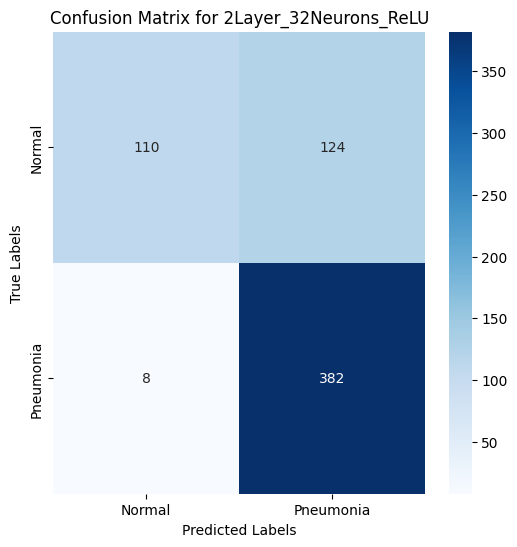

Classification Report for 2Layer_32Neurons_ReLU:
              precision    recall  f1-score   support

           0       0.93      0.47      0.62       234
           1       0.75      0.98      0.85       390

    accuracy                           0.79       624
   macro avg       0.84      0.72      0.74       624
weighted avg       0.82      0.79      0.77       624

20/20 [==============================] - 4s 218ms/step


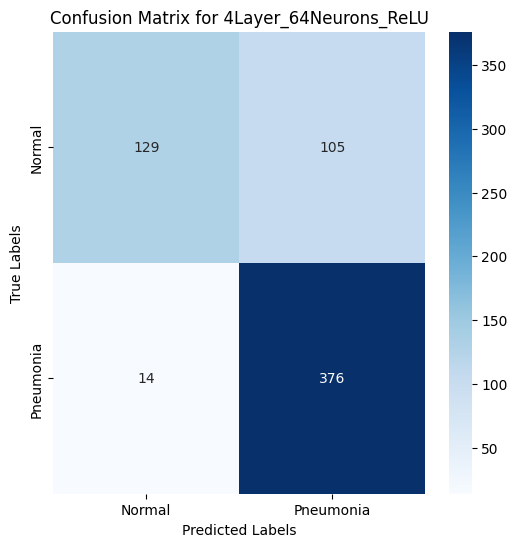

Classification Report for 4Layer_64Neurons_ReLU:
              precision    recall  f1-score   support

           0       0.90      0.55      0.68       234
           1       0.78      0.96      0.86       390

    accuracy                           0.81       624
   macro avg       0.84      0.76      0.77       624
weighted avg       0.83      0.81      0.80       624

20/20 [==============================] - 10s 488ms/step


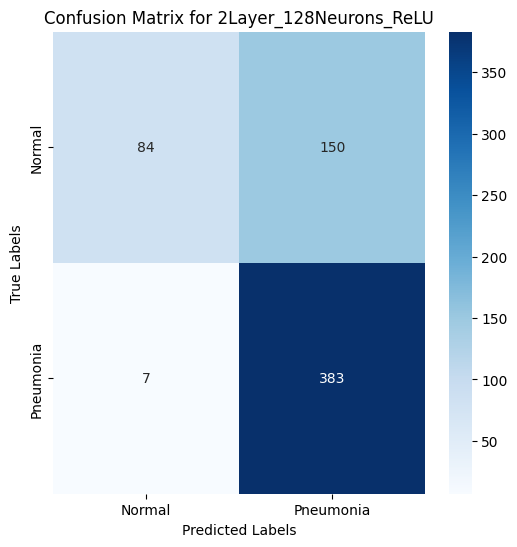

Classification Report for 2Layer_128Neurons_ReLU:
              precision    recall  f1-score   support

           0       0.92      0.36      0.52       234
           1       0.72      0.98      0.83       390

    accuracy                           0.75       624
   macro avg       0.82      0.67      0.67       624
weighted avg       0.80      0.75      0.71       624

20/20 [==============================] - 2s 113ms/step


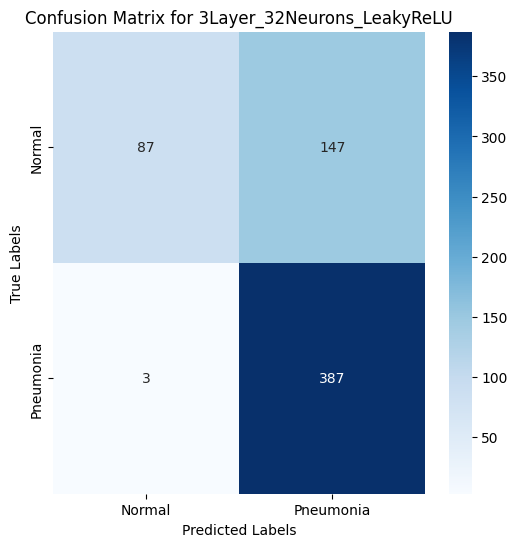

Classification Report for 3Layer_32Neurons_LeakyReLU:
              precision    recall  f1-score   support

           0       0.97      0.37      0.54       234
           1       0.72      0.99      0.84       390

    accuracy                           0.76       624
   macro avg       0.85      0.68      0.69       624
weighted avg       0.82      0.76      0.72       624

20/20 [==============================] - 2s 105ms/step


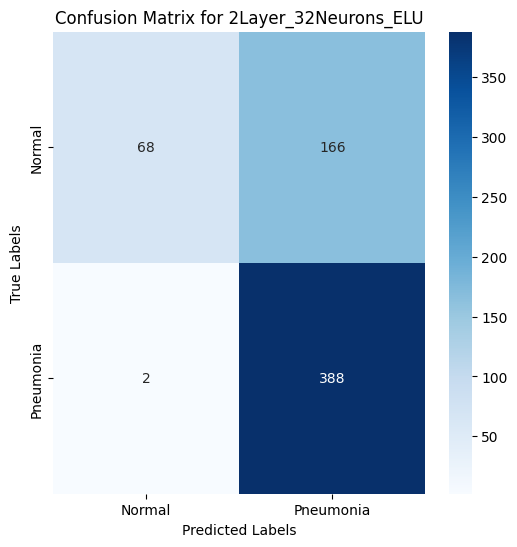

Classification Report for 2Layer_32Neurons_ELU:
              precision    recall  f1-score   support

           0       0.97      0.29      0.45       234
           1       0.70      0.99      0.82       390

    accuracy                           0.73       624
   macro avg       0.84      0.64      0.63       624
weighted avg       0.80      0.73      0.68       624



In [26]:
# Function to Evaluate Model Performance
# This function evaluates a model using test data, displaying a confusion matrix and a classification report.
# It provides detailed insights into the model's performance, including its accuracy and ability to generalize.
def evaluate_model(model, model_name, X_test, y_test):
    """
    Perform a detailed evaluation of the model.
    Includes the model name in the output for clear identification.
    """
    # Predictions
    predictions = (model.predict(X_test) > 0.5).astype(int).flatten()

    # Confusion Matrix
    cm = confusion_matrix(y_test, predictions)
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

    # Classification Report
    print(f"Classification Report for {model_name}:")
    print(classification_report(y_test, predictions))

# Loop through each model and evaluate it
for config in configurations:
    model_name = config['name']
    model = models_histories[model_name].model  # Retrieve the model from history
    evaluate_model(model, model_name, X_test, y_test)


Analyzing and interpreting the outcome of evaluate_model(best_model, X_test, y_test) involves looking at the confusion matrix and the classification report to assess the model's performance. Here's how you can interpret the results:

1. Confusion Matrix Analysis
True Positives (TP): Number of cases correctly identified as Pneumonia.
True Negatives (TN): Number of cases correctly identified as Normal.
False Positives (FP): Number of Normal cases incorrectly identified as Pneumonia.
False Negatives (FN): Number of Pneumonia cases incorrectly identified as Normal.
Key Points to Consider:

A high number of TP and TN indicates good performance.
FP can lead to unnecessary anxiety or treatment for patients.
FN is particularly serious as it might mean missing out on diagnosing a potentially serious condition.

2. Classification Report Analysis
Precision (Pneumonia): Of all the cases the model predicted as Pneumonia, how many were actually Pneumonia? Precision = TP / (TP + FP).
Recall (Sensitivity, Pneumonia): Of all the actual Pneumonia cases, how many were correctly predicted by the model? Recall = TP / (TP + FN).
F1-Score: The harmonic mean of Precision and Recall. An F1-score close to 1 indicates a balance between Precision and Recall.
Accuracy: Overall, how often is the model correct? Accuracy = (TP + TN) / Total Cases.

Interpreting the Results

High Recall, Low Precision (Pneumonia): The model is effective at identifying Pneumonia (few FN), but at the cost of incorrectly classifying some Normal cases as Pneumonia (higher FP).

High Precision, Low Recall (Pneumonia): The model is highly accurate when it predicts Pneumonia, but it misses a significant number of Pneumonia cases (higher FN).

Balanced Precision and Recall: The model performs well at identifying Pneumonia cases without misclassifying too many Normal cases.
Overall Assessment

Good Model: High accuracy, along with a good balance between precision and recall for Pneumonia. Low FN is crucial in medical diagnoses.
Needs Improvement: If any of the metrics are significantly low, especially recall for Pneumonia or overall accuracy. High FN rate is a serious issue in medical diagnostic models.